In [143]:
%pip install ipympl

Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\users\kubad\appdata\local\programs\python\python312\lib\site-packages\qhvlib-1.0-py3.12-win-amd64.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at c:\users\kubad\appdata\local\programs\python\python312\lib\site-packages\quick_hypervolume_library-1.0-py3.12-win-amd64.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at c:\users\kubad\appdata\local\programs\python\python312\lib\site-packages\voicepkg-1.0-py3.12-win-amd64.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330

[notic

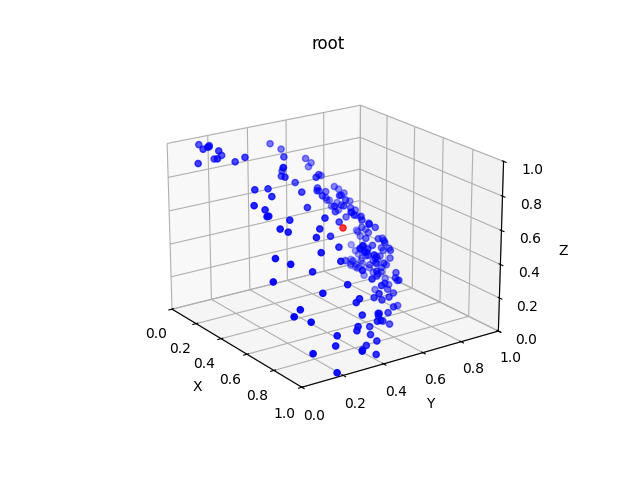

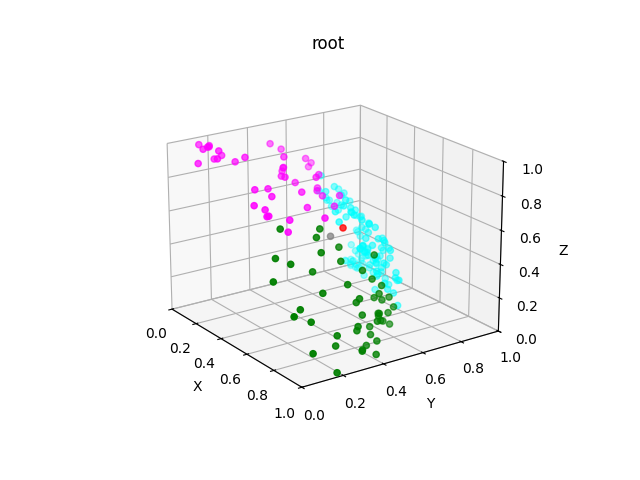

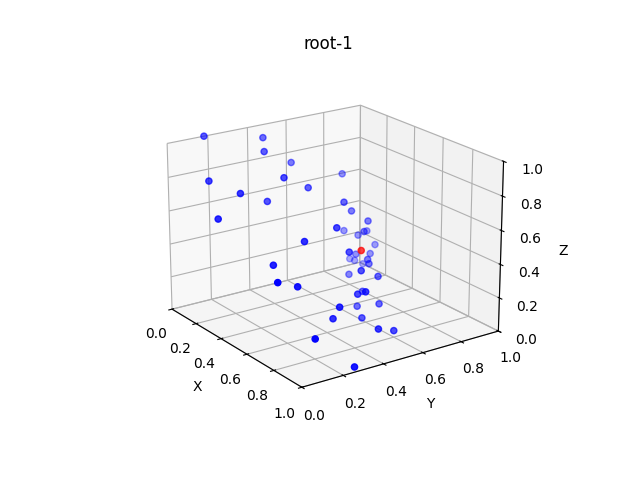

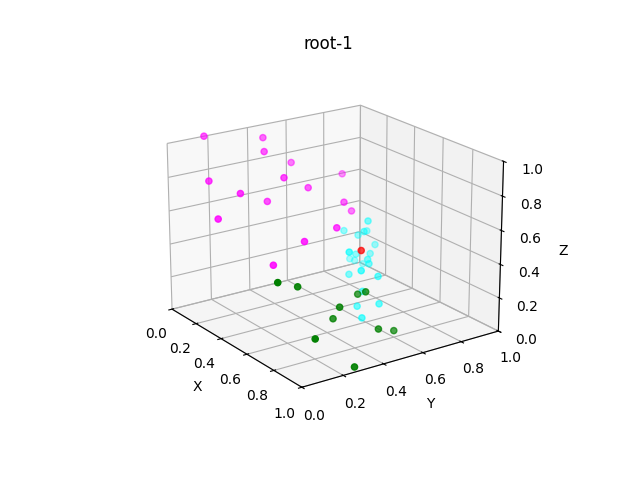

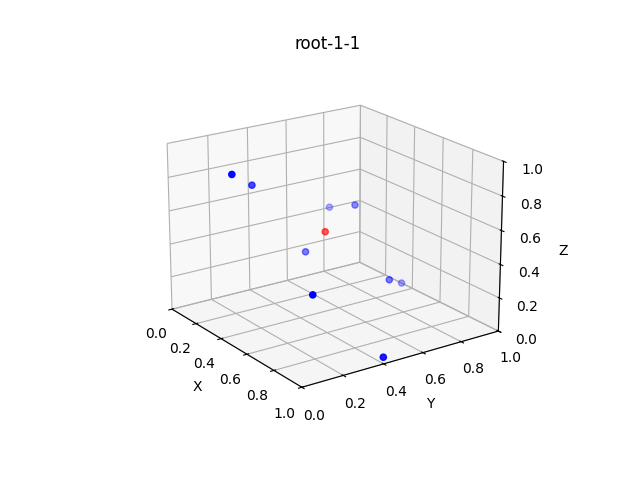

...

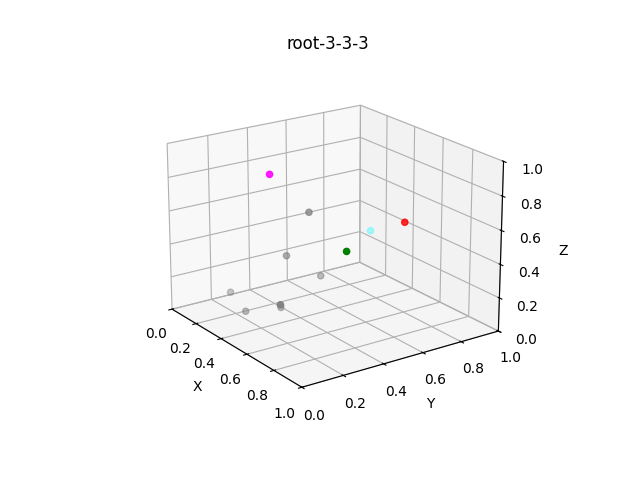

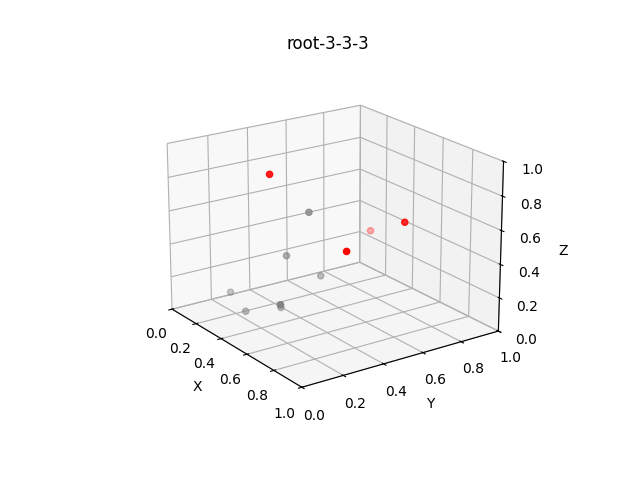

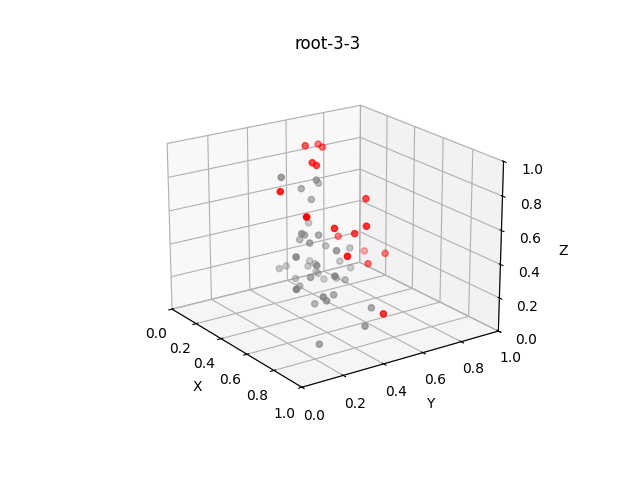

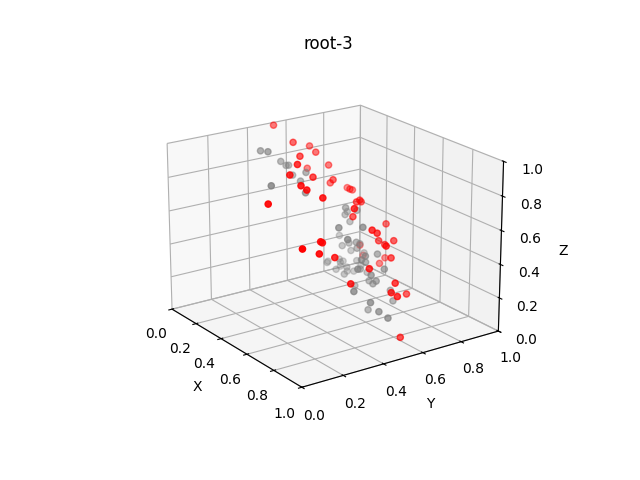

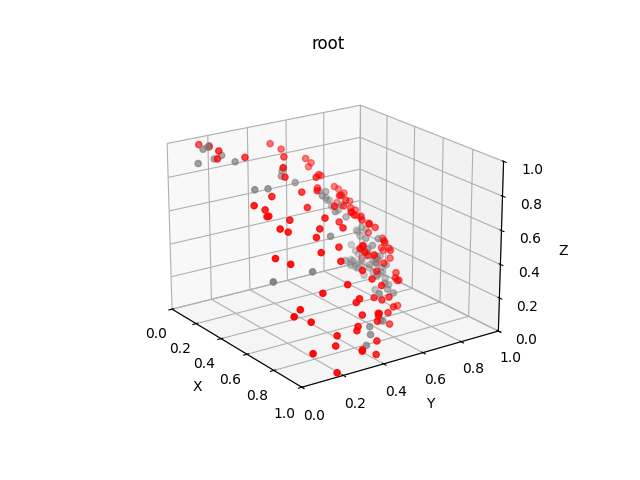

10101


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np

%matplotlib widget
SOLUTION_SIZE = 200
DRAW_MAX_LEVEL = 3
TOTAL_DOM_COMPARISONS = 0
def colorMap(status):
    cmap = {'new':'blue','decomp1':'green','decomp2':'magenta','decomp3':'cyan','pareto':'red','pivot':'red','dominated':'grey'}
    colors = [cmap.get(s, 'black') for s in status]
    return colors
def mapPoint(p,nadir,ideal):
    p[0] = (p[0] - nadir[0])/(ideal[0]-nadir[0])
    p[1] = (p[1] - nadir[1])/(ideal[1]-nadir[1])
    p[2] = (p[2] - nadir[2])/(ideal[2]-nadir[2])
    return p
def findPivot(set, nadir, ideal):
    tempSet = [mapPoint(p,nadir,ideal) for p in set]
    contributions = np.array([x*y*z for [x,y,z] in tempSet])
    pivot = np.argmax(contributions)
    return pivot
def findNadir(set):
    return [min(set[:,0]),min(set[:,1]),min(set[:,2])]
def findIdeal(set):
    return [max(set[:,0]),max(set[:,1]),max(set[:,2])]
def findDominated(set, potential_dominators, level,path):
    global TOTAL_DOM_COMPARISONS
    # print(set)
    if(len(set) == 0) :
        return []
    if(len(set) == 1) :
        return['pareto']
    if(len(set) == 2) :
        return['pareto','pareto']
    status = ['new' for _ in set]
    nadir = findNadir(set)
    ideal = findIdeal(set)
    pivot = findPivot(set,nadir,ideal)
    status[pivot] = 'pivot'
    if level <= DRAW_MAX_LEVEL:
        draw(set,potential_dominators,status,'problem ' + path)
    potential_dominators1 = potential_dominators.copy()
    potential_dominators2 = potential_dominators.copy()
    for i,p in enumerate(set):
        if i == pivot: continue
        if p[0] > set[pivot][0]:
            status[i] = 'decomp1'
            if p[1] > set[pivot][1]:
                potential_dominators1.append(p)
            if p[2] > set[pivot][2]:
                potential_dominators2.append(p)
        elif p[1] > set[pivot][1]:
            status[i] = 'decomp2'
            if p[2] > set[pivot][2]:
                potential_dominators2.append(p)
        elif p[2] > set[pivot][2]:
            status[i] = 'decomp3'
        else:
            status[i] = 'dominated'
        for potential_dominator in potential_dominators:
            dominates = True
            TOTAL_DOM_COMPARISONS += 1
            for j in range(3):
                if potential_dominator[j] < p[j]:
                    dominates = False
            if dominates:
                status[i] = 'dominated'    
    decomp1Set = [p for i,p in enumerate(set) if status[i] == 'decomp1']
    iters1Set = [i for i,_ in enumerate(set) if status[i] == 'decomp1']
    decomp2Set = [p for i,p in enumerate(set) if status[i] == 'decomp2']
    iters2Set = [i for i,_ in enumerate(set) if status[i] == 'decomp2']
    decomp3Set = [p for i,p in enumerate(set) if status[i] == 'decomp3']
    iters3Set = [i for i,_ in enumerate(set) if status[i] == 'decomp3']
    if level <= DRAW_MAX_LEVEL:
        draw(set,[],status,'decomposition ' + path)
    result1 = findDominated(np.array(decomp1Set),[], level+1, path+'-1')
    for i,istatus in enumerate(result1):
        real_i = iters1Set[i]
        if istatus == 'pareto' or istatus == 'dominated':
            status[real_i] = istatus
    result2 = findDominated(np.array(decomp2Set),potential_dominators1, level+1, path+'-2')
    for i,istatus in enumerate(result2):
        real_i = iters2Set[i]
        if istatus == 'pareto' or istatus == 'dominated':
            status[real_i] = istatus
    result3 = findDominated(np.array(decomp3Set),potential_dominators2, level+1, path+'-3')
    for i,istatus in enumerate(result3):
        real_i = iters3Set[i]
        if istatus == 'pareto' or istatus == 'dominated':
            status[real_i] = istatus
    status[pivot] = 'pareto'
    if level <= DRAW_MAX_LEVEL:
        draw(set,[],status,'solution ' + path)
    return status

def findDominated2(set, potentially_dominated, level):
    global TOTAL_DOM_COMPARISONS
    if(len(set) == 0) :
        return []
    if(len(set) == 1) :
        return['pareto']
    if(len(set) == 2) :
        return['pareto','pareto']
    status = ['new' for _ in set]
    nadir = findNadir(set)
    ideal = findIdeal(set)
    pivot = findPivot(set,nadir,ideal)
    status[pivot] = 'pivot'
    if level <= DRAW_MAX_LEVEL:
        draw(set,[],status)
    new_potentially_dominated_iters = []
    for i,p in enumerate(potentially_dominated):
        TOTAL_DOM_COMPARISONS += 1
        if p[0] < ideal[0] and p[1] < ideal[1] and p[2] < ideal[2]:
            new_potentially_dominated_iters.append(i)
    new_potentially_dominated = []
    for p in new_potentially_dominated_iters:
        if set[pivot][0] > set[i][0] and set[pivot][1] > set[i][1] and set[pivot][2] > set[i][2]:
            status[i] = 'dominated'
        else:
            new_potentially_dominated.append(set[i])
    for i,p in enumerate(set):
        if i == pivot: continue
        if status[i] == 'dominated': continue
        if p[0] > set[pivot][0]:
            status[i] = 'decomp1'
        elif p[1] > set[pivot][1]:
            status[i] = 'decomp2'
        elif p[2] > set[pivot][2]:
            status[i] = 'decomp3'
        else:
            status[i] = 'dominated'
 
    decomp1Set = [p for i,p in enumerate(set) if status[i] == 'decomp1']
    iters1Set = [i for i,_ in enumerate(set) if status[i] == 'decomp1']
    decomp2Set = [p for i,p in enumerate(set) if status[i] == 'decomp2']
    iters2Set = [i for i,_ in enumerate(set) if status[i] == 'decomp2']
    decomp3Set = [p for i,p in enumerate(set) if status[i] == 'decomp3']
    iters3Set = [i for i,_ in enumerate(set) if status[i] == 'decomp3']
    if level <= DRAW_MAX_LEVEL:
        draw(set,status)
    result1 = findDominated2(np.array(decomp1Set),[], level+1)
    for i,istatus in enumerate(result1):
        real_i = iters1Set[i]
        if istatus == 'pareto' or istatus == 'dominated':
            status[real_i] = istatus
    result2 = findDominated2(np.array(decomp2Set),new_potentially_dominated, level+1)
    for i,istatus in enumerate(result2):
        real_i = iters2Set[i]
        if istatus == 'pareto' or istatus == 'dominated':
            status[real_i] = istatus
    result3 = findDominated2(np.array(decomp3Set),new_potentially_dominated, level+1)
    for i,istatus in enumerate(result3):
        real_i = iters3Set[i]
        if istatus == 'pareto' or istatus == 'dominated':
            status[real_i] = istatus
    status[pivot] = 'pareto'
    if level <= DRAW_MAX_LEVEL:
        draw(set,status)
    return status
    
def draw(set,potential_dominators,status,title):
    ax = plt.figure().add_subplot(projection='3d')
    if potential_dominators != []:
        potential_dominators = np.array(potential_dominators)
        ax.scatter(potential_dominators[:,0], potential_dominators[:,1], potential_dominators[:,2], zdir='y', c='purple')
    ax.scatter(set[:,0], set[:,1], set[:,2], zdir='y', c=colorMap(status))
    cmap = {'new':'blue','decomp1':'green','decomp2':'magenta','decomp3':'cyan','pareto':'red','pivot':'red','dominated':'grey','potential dominator':'violet'}
    legend_elements = [
    
        Line2D([0], [0], marker='o', color='w', label=label, 
           markerfacecolor=color, markersize=8) 
    
        for label, color in cmap.items()
    ]
    # ax.legend(handles=legend_elements, title="Solution Types")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_zlim(0, 1)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.view_init(elev=20., azim=-35, roll=0)
    ax.set_title(title)
    plt.show()
def generateSolution(n, seed, delta):
    np.random.seed(seed)
    solution = []
    for i in range(n):
        r = 1 - np.random.random(1)[0] * delta
        [[phi,Phi]] = np.random.random([1,2]) * np.pi / 2
        x = r * np.sin(phi) * np.cos(Phi)
        y = r * np.sin(phi) * np.sin(Phi)
        z = r * np.cos(phi)
        solution.append([x,y,z])
    return np.array(solution)


sol = generateSolution(SOLUTION_SIZE,123,0.1)
findDominated(sol,[],0,'root')
print(TOTAL_DOM_COMPARISONS)

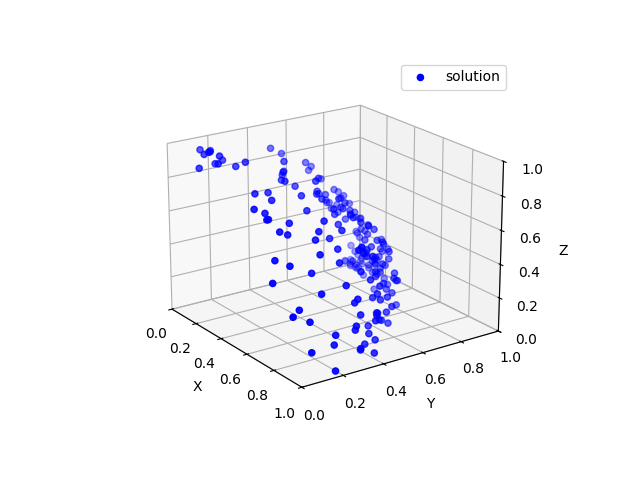

In [44]:


sol = generateSolution(200,123,0.1)
status = ['blue' for _ in range(200)]
draw()

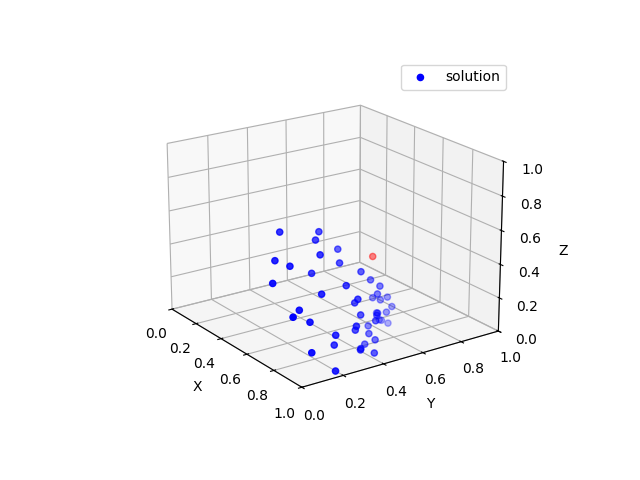

In [ ]:

status[pivot] = 'red'
draw()

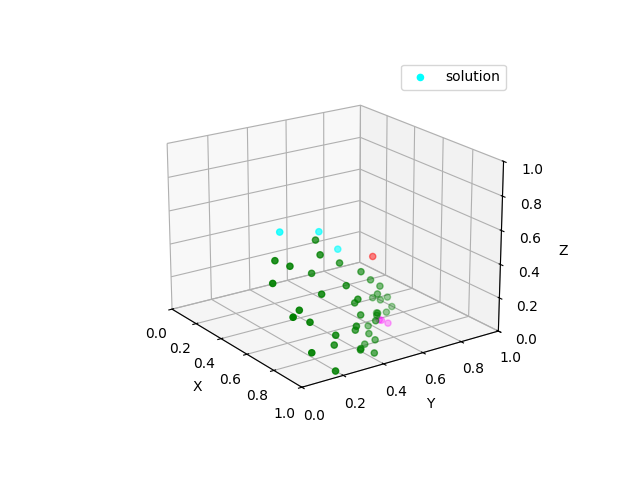

In [60]:
contributions = np.array([x*y*z for [x,y,z] in sol])
pivot = np.argmax(contributions)
for i,p in enumerate(sol):
    if i == pivot: continue
    if p[0] > sol[pivot][0]:
        status[i] = 'green' #box1
    elif p[1] > sol[pivot][1]:
        status[i] = 'cyan' #box2
    elif p[2] > sol[pivot][2]:
        status[i] = 'magenta' #box3
    else:
        status[i] = 'grey'
draw()

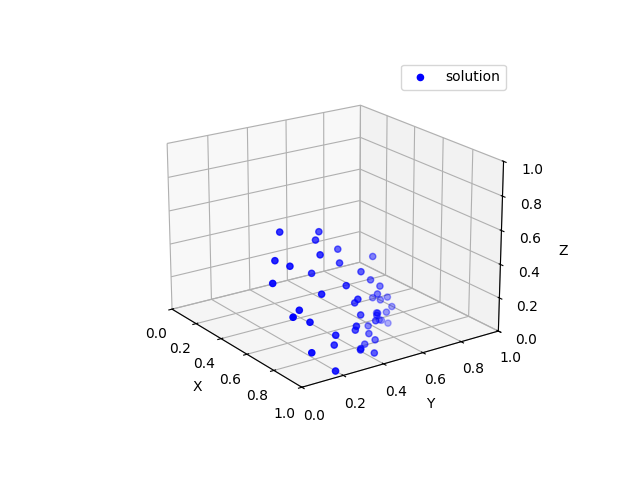

In [58]:
box1 = sol[[i for i,s in enumerate(sol) if status[i] == 'green']]
all_solutions = sol
sol = box1
all_status = status
status = ['blue' for _ in range(len(box1))]
draw()